In [2]:
import json 
with open('iranianNamesDataset.json', 'r', encoding="utf-8") as f:
    word_dict = json.load(f)
words = []
for name in word_dict['RECORDS']:
    words.append(name['Names'])
words

['ابوالحسن',
 'احمد',
 'احمدرضا',
 'آذر',
 'آرش',
 'آ رمان',
 'آ ریا',
 'ا زاده',
 'آ زاد',
 'ا سماعیل',
 'اشرف',
 'ا صغر',
 'ا عظم',
 'افسانه',
 'ا فشین',
 'ا قدس',
 'ا کبر',
 'آ کو',
 'آ لان',
 'ا لشان',
 'ا لنا ز',
 'ا لناز',
 'ا لها م',
 'ا لهه',
 'ا م البنین',
 'ا میر',
 'ا میر حسین',
 'ا میر ر ضا',
 'آ مینه',
 'آ ناهید',
 'ا نیس',
 'آوات',
 'آ ی تک',
 'ادریس',
 'اسدالله',
 'اصغر',
 'اکبر',
 'الله بردی',
 'الهام',
 'ام لیلا',
 'امید',
 'ایرج',
 'ابا',
 'ابا بکر',
 'ابا ذر',
 'ابا سلت',
 'ابا صلت',
 'ابابکر',
 'ابات',
 'آباد',
 'آبادان',
 'ابادر',
 'اباذر',
 'اباذر علی',
 'ابراهیم',
 'اباز',
 'ابازر',
 'اباس',
 'اباسط',
 'اباسعد',
 'اباسل',
 'اباسلت',
 'اباسلط',
 'اباسلک',
 'اباصت',
 'اباصد',
 'اباصل',
 'اباصلت',
 'اباصلط',
 'ابالفتح',
 'ابالفضل',
 'آبامه',
 'آبان',
 'آبان دخت',
 'اباهیم',
 'آبت اله',
 'ابتاج',
 'ابتسام',
 'ابتسلم',
 'ابتصام',
 'ابتهاج',
 'ابتین',
 'آبتین آی',
 'آبث',
 'ابجد',
 'ابحش',
 'ابخش',
 'ابدال',
 'ابدالحسن',
 'ابدالرضا',
 'ابدالفضل',
 'ابدالمجید',
 'ابدالو

In [3]:
b = {}
for w in words:
    chs = ['<S>'] + list(w) + ['<E>']
    for ch1, ch2 in zip(chs, chs[1:]):
        bigram = (ch1, ch2)
        b[bigram] = b.get(bigram, 0) + 1
        

In [4]:
sorted(b.items(), key = lambda kv: -kv[1])

[(('ه', '<E>'), 3168),
 (('<S>', 'م'), 3151),
 (('ی', '<E>'), 3028),
 (('ا', 'ل'), 2905),
 (('ن', '<E>'), 2502),
 (('ا', 'ن'), 2458),
 (('<S>', 'ا'), 2298),
 (('ل', 'ی'), 2240),
 ((' ', 'ا'), 1733),
 (('<S>', 'ع'), 1728),
 (('ا', '<E>'), 1677),
 (('ر', '<E>'), 1672),
 (('د', '<E>'), 1644),
 (('ی', 'ر'), 1598),
 (('م', 'ی'), 1558),
 (('ع', 'ل'), 1487),
 (('ر', 'ا'), 1479),
 (('ا', 'م'), 1390),
 (('ح', 'م'), 1389),
 (('ی', 'ن'), 1373),
 (('م', '<E>'), 1224),
 (('م', 'د'), 1208),
 (('ل', 'ه'), 1201),
 (('م', 'ح'), 1193),
 (('ی', ' '), 1179),
 (('ب', 'ی'), 1140),
 (('<S>', 'س'), 1139),
 (('ر', ' '), 1120),
 (('د', 'ی'), 1117),
 (('ا', 'ر'), 1116),
 (('د', 'ا'), 1104),
 (('ل', '<E>'), 1047),
 (('<S>', 'ن'), 1045),
 (('<S>', 'ب'), 1036),
 (('ا', 'د'), 1027),
 (('م', 'ا'), 966),
 ((' ', 'ب'), 939),
 (('د', ' '), 933),
 (('ب', 'ا'), 921),
 (('ر', 'ی'), 914),
 (('ن', 'ا'), 900),
 (('ی', 'ا'), 894),
 (('ع', 'ب'), 826),
 (('<S>', 'ش'), 807),
 (('و', 'ر'), 801),
 (('<S>', 'ف'), 799),
 (('ل', 'ا'),

In [5]:
import torch

In [6]:
N = torch.zeros((38, 38), dtype = torch.int32)

In [7]:
N

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.int32)

In [8]:
chars = sorted(list(set(''.join(words))))
Abakolah = chars[5]
chars = chars[9:-1]
chars.insert(0, Abakolah)
stoi = {s:i+1 for i,s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s,i in stoi.items()}

In [9]:
itos

{1: 'آ',
 2: 'ا',
 3: 'ب',
 4: 'ت',
 5: 'ث',
 6: 'ج',
 7: 'ح',
 8: 'خ',
 9: 'د',
 10: 'ذ',
 11: 'ر',
 12: 'ز',
 13: 'س',
 14: 'ش',
 15: 'ص',
 16: 'ض',
 17: 'ط',
 18: 'ظ',
 19: 'ع',
 20: 'غ',
 21: 'ـ',
 22: 'ف',
 23: 'ق',
 24: 'ل',
 25: 'م',
 26: 'ن',
 27: 'ه',
 28: 'و',
 29: 'ى',
 30: 'ً',
 31: 'پ',
 32: 'چ',
 33: 'ژ',
 34: 'ک',
 35: 'گ',
 36: 'ھ',
 37: 'ی',
 0: '.'}

In [10]:
for w in words:
    chs = ['.'] + list(w) + ['.']
    try:
        for ch1, ch2 in zip(chs, chs[1:]):
            ix1 = stoi[ch1]
            ix2 = stoi[ch2]
            N[ix1, ix2] += 1
    except:
        pass
N

tensor([[   0,  367, 2298,  ...,  437,    0,  297],
        [   0,    0,    0,  ...,    1,    0,   48],
        [1151,    2,   87,  ...,   22,    0,  624],
        ...,
        [  58,    0,   71,  ...,    0,    0,   86],
        [   1,    0,    0,  ...,    0,    0,    0],
        [1702,    0,  777,  ...,   54,    0,  140]], dtype=torch.int32)

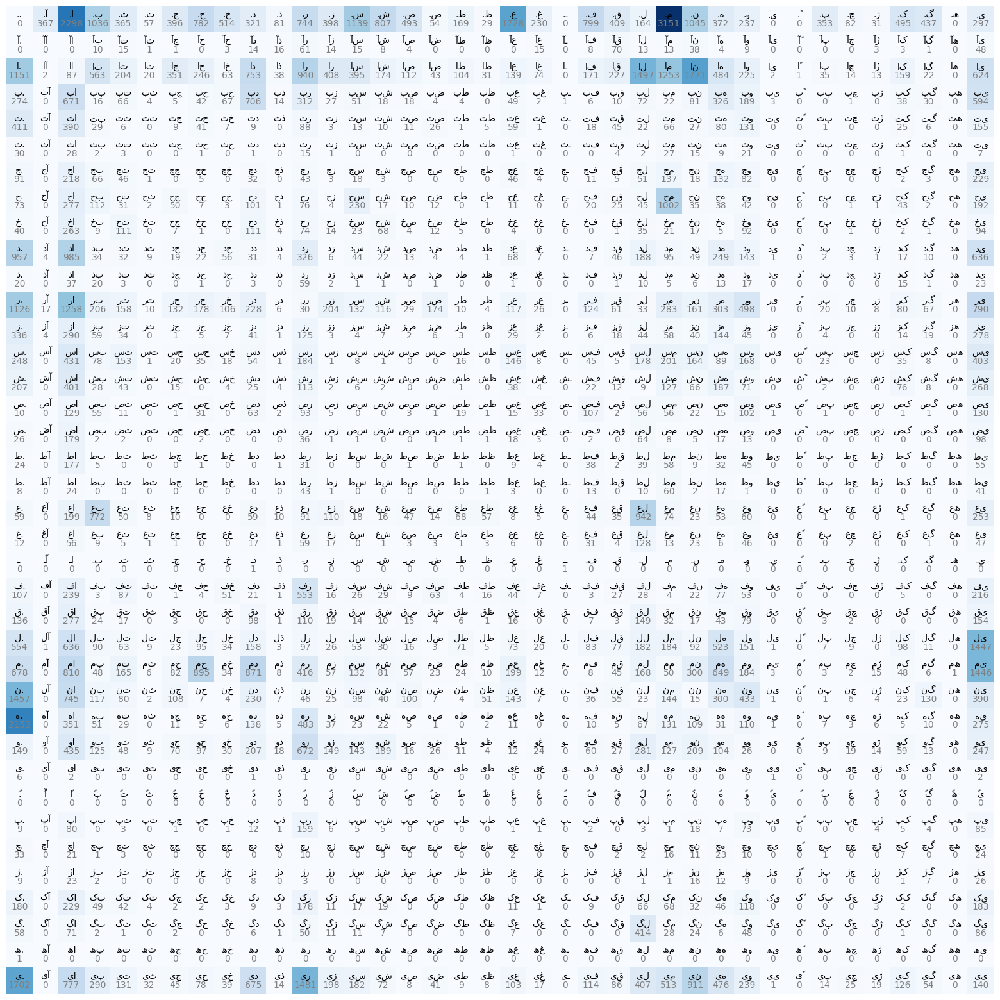

In [11]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(20,20), )
plt.imshow(N, cmap="Blues", )
for i in range(38):
    for j in range(38):
        chstr = itos[i] + itos[j]
        plt.text(j, i, chstr, ha="center", va="bottom", color='black')
        plt.text(j, i, N[i, j].item(), ha="center", va="top", color='gray')
plt.axis('off');

In [12]:
N[0]

tensor([   0,  367, 2298, 1036,  365,   57,  396,  782,  514,  321,   81,  744,
         398, 1139,  807,  493,   54,  169,   29, 1728,  230,    0,  799,  409,
         164, 3151, 1045,  372,  237,    0,    0,  353,   82,   31,  495,  437,
           0,  297], dtype=torch.int32)

In [13]:
probability = (N+1).float() 
probability /= probability.sum(1, keepdim=True )
probability

tensor([[5.0206e-05, 1.8476e-02, 1.1542e-01,  ..., 2.1990e-02, 5.0206e-05,
         1.4961e-02],
        [2.3529e-03, 2.3529e-03, 2.3529e-03,  ..., 4.7059e-03, 2.3529e-03,
         1.1529e-01],
        [9.2649e-02, 2.4127e-04, 7.0774e-03,  ..., 1.8498e-03, 8.0425e-05,
         5.0265e-02],
        ...,
        [6.7661e-02, 1.1468e-03, 8.2569e-02,  ..., 1.1468e-03, 1.1468e-03,
         9.9771e-02],
        [5.1282e-02, 2.5641e-02, 2.5641e-02,  ..., 2.5641e-02, 2.5641e-02,
         2.5641e-02],
        [1.8787e-01, 1.1031e-04, 8.5825e-02,  ..., 6.0673e-03, 1.1031e-04,
         1.5554e-02]])

In [14]:

gen = torch.Generator().manual_seed(297)
for i in range(10):
    name = []
    ix = 0
    while True:
        p = probability[ix]
        ix = torch.multinomial(p, replacement= True, generator= gen, num_samples = 1).item()
        if ix == 0:
            break
        name.append(itos[ix])
    print(name)

['آ', 'ر', 'و']
['گ', 'ل', 'ی', 'ح', 'ا', 'م', 'ا', 'ل']
['ع', 'ا', 'د', 'ر', 'ی', 'م', 'ا', 'ب', 'ی']
['ن']
['م', 'ر']
['ع', 'ل', 'ی', 'ا', 'ج', 'م', 'د', 'ه', 'د', 'ل', 'ه', 'ر', 'ه', 'ص', 'ر', 'م', 'ی', 'ل']
['ر', 'م', 'د', 'ه']
['س', 'ی', 'ل', 'د', 'و', 'م', 'ح', 'س', 'ی', 'ن', 'گ', 'ل', 'ی', 'ل', 'ه']
['ص', 'ع', 'ل', 'ه', 'ر', 'ی']
['م', 'ا', 'ی', 'ن', 'گ', 'ی', 'ح', 'م', 'و', 'ا', 'ج', 'ا', 'ل', 'ل', 'ی', 'ژ', 'ا', 'ن']


In [15]:
mp = 0
log_likelyhood = 0
for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(w, w[1:]):
        try:
            ix1, ix2 = stoi[ch1], stoi[ch2]
            prob = probability[ix1, ix2]
            logprob = torch.log(prob)
            log_likelyhood += logprob
            if 0.5 != prob > mp:
                mp = prob
                bi = ch1 + ch2
            print(f'bigram in {ch1 + ch2} and probability for it is {prob: .4f} and the log prob is {logprob}')
        except:
            pass
print(f'the most probable bigram is {bi} with probability of {mp} and logprob of it is {torch.log(mp)}')
print(f'the average negative log likelygood(loss) of the model is {-log_likelyhood / len(words)}')

bigram in اب and probability for it is  0.0454 and the log prob is -3.0931355953216553
bigram in بو and probability for it is  0.0505 and the log prob is -2.9854161739349365
bigram in وا and probability for it is  0.1189 and the log prob is -2.1294870376586914
bigram in ال and probability for it is  0.1205 and the log prob is -2.1163036823272705
bigram in لح and probability for it is  0.0193 and the log prob is -3.9454174041748047
bigram in حس and probability for it is  0.0923 and the log prob is -2.382427930831909
bigram in سن and probability for it is  0.0598 and the log prob is -2.81704044342041
bigram in اح and probability for it is  0.0199 and the log prob is -3.9188015460968018
bigram in حم and probability for it is  0.4009 and the log prob is -0.9140949249267578
bigram in مد and probability for it is  0.1151 and the log prob is -2.161687135696411
bigram in اح and probability for it is  0.0199 and the log prob is -3.9188015460968018
bigram in حم and probability for it is  0.4009 

In [17]:
xs, ys = [], []

for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        try:
            ix1 = stoi[ch1]
            ix2 = stoi[ch2]
            xs.append(ix1)
            ys.append(ix2)
        except:
            pass
xs = torch.tensor(xs)
ys = torch.tensor(ys)

In [18]:
import torch.nn.functional as F
xenc = F.one_hot(xs, 38).float()

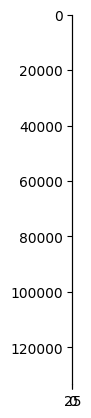

In [19]:
plt.imshow(xenc)

In [20]:
xenc.dtype

torch.float32

In [21]:
g = torch.Generator()
W = torch.randn((38, 38), generator=g,requires_grad=True)
logits = xenc @ W #log counts
counts = logits.exp()
probability = counts / counts.sum(1, keepdim = True)

In [22]:
nlls = torch.zeros(9)
for i in range(9):
    x = xs[i].item()
    y = ys[i].item()
    print(f'x = {x}, y = {y}')
    p = probability[i, y]
    logp = torch.log(p)
    nll = -logp
    print(nll)
    nlls[i] = nll
nlls.mean().item()

x = 0, y = 2
tensor(3.1400, grad_fn=<NegBackward0>)
x = 2, y = 3
tensor(3.7019, grad_fn=<NegBackward0>)
x = 3, y = 28
tensor(3.6916, grad_fn=<NegBackward0>)
x = 28, y = 2
tensor(3.4076, grad_fn=<NegBackward0>)
x = 2, y = 24
tensor(3.5820, grad_fn=<NegBackward0>)
x = 24, y = 7
tensor(4.6058, grad_fn=<NegBackward0>)
x = 7, y = 13
tensor(3.0264, grad_fn=<NegBackward0>)
x = 13, y = 26
tensor(4.8448, grad_fn=<NegBackward0>)
x = 26, y = 0
tensor(6.3012, grad_fn=<NegBackward0>)


4.033485412597656

In [25]:
loss = - probability[torch.arange(9), ys].log().mean()
#loss

IndexError: shape mismatch: indexing tensors could not be broadcast together with shapes [9], [133330]

In [24]:
W.grad = None
loss.backward()

NameError: name 'loss' is not defined

In [126]:
W.grad

tensor([[ 0.0019,  0.0004, -0.1063,  ...,  0.0014,  0.0009,  0.0008],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0008,  0.0047,  0.0014,  ...,  0.0038,  0.0010,  0.0079],
        ...,
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]])

In [136]:
W.data += -0.1 * W.grad

In [26]:
logits = xenc @ W #log counts
counts = logits.exp()
probability = counts / counts.sum(1, keepdim = True)

In [40]:
num = xs.nelement()
for k in range(1000):
    xenc = F.one_hot(xs, num_classes = 38).float()
    logits = xenc @ W
    counts = logits.exp()
    probs = counts / counts.sum(1, keepdims = True)
    loss = - probs[torch.arange(num), ys].log().mean()
    if k % 100 == 0: print(loss.item())

    W.grad = None
    loss.backward()
    
    W.data -= 5 * W.grad

2.664449691772461
2.644744634628296
2.6314499378204346
2.6217589378356934
2.6143267154693604
2.608426809310913
2.603626251220703
2.5996479988098145
2.5963025093078613
2.593454360961914


In [30]:
probs.shape

torch.Size([133330, 38])

RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

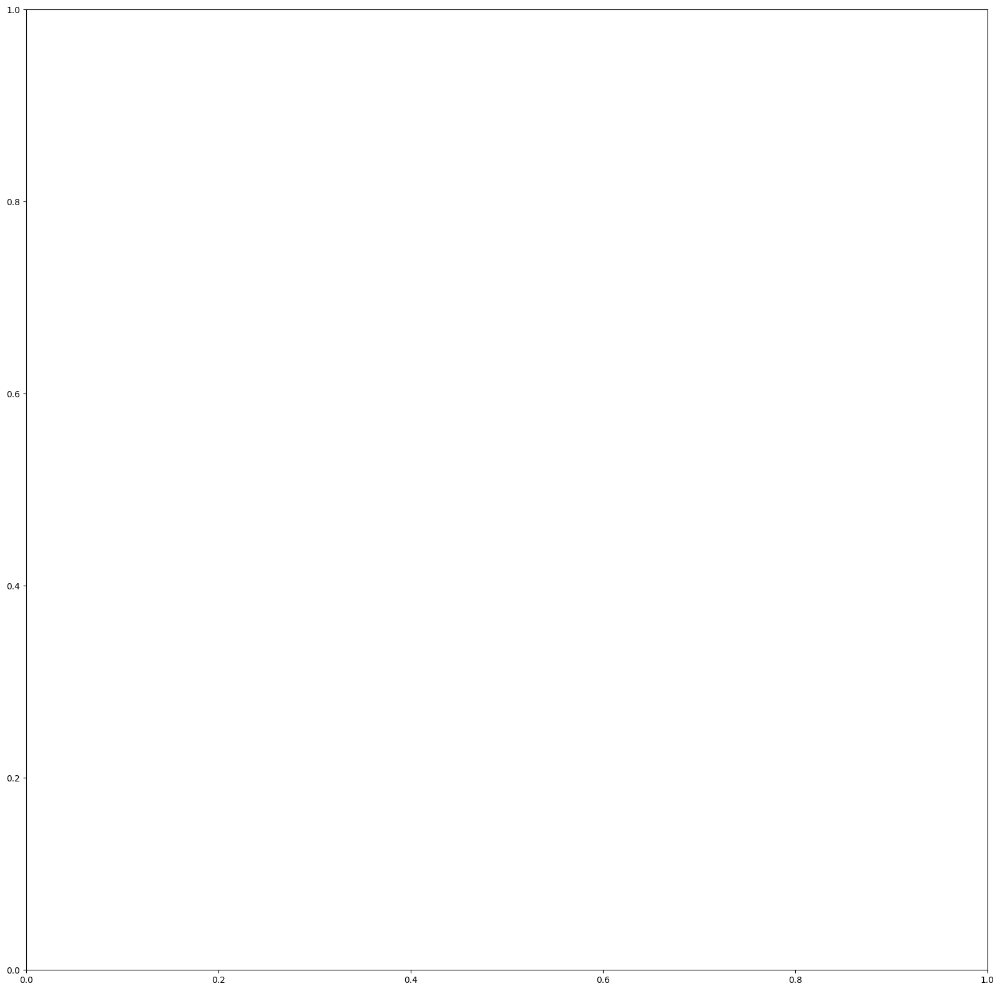

In [59]:
plt.figure(figsize=(20,20),  )
plt.imshow(W.detach().numpy(), cmap = "Blues")
for i in range(38):
    for j in range(38):
        chstr = itos[i] + '->' + itos[j]
        plt.text(i, j, chstr, ha="center", va="bottom", color='black')
        #print("A")
        plt.text(i, j, f'{ W[i, j].item():0.2f}', ha="center", va="top", color='gray')



In [54]:
W.shape

torch.Size([38, 38])

tensor([     0,      1,      2,  ..., 133327, 133328, 133329])